# 프로젝트 1: Image Classification

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

## 데이터 불러오기

In [2]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

68606236/68606236 [==============================] - 0s 0us/step


In [3]:
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train
/root/.keras/datasets/cats_and_dogs_filtered/validation


In [4]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
print(train_cats_dir)

# directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
print(validation_dogs_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train/cats
/root/.keras/datasets/cats_and_dogs_filtered/train/dogs
/root/.keras/datasets/cats_and_dogs_filtered/validation/cats
/root/.keras/datasets/cats_and_dogs_filtered/validation/dogs


In [5]:
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [6]:
# parameter Initialization
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [7]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

## Data Augmentation

In [8]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

.flow_from_directory를 사용하여 파이프라인을 만들어 directory와 작업 환경을 연결시켜 줍니다. 우리는 개와 고양이를 분류하는 task를 수행하기 때문에class_mode는 'binary'입니다. Classification task에 따라 class_mode를 변경하시면 됩니다.

In [9]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [10]:
train_data_gen[0][0].shape

(16, 256, 256, 3)

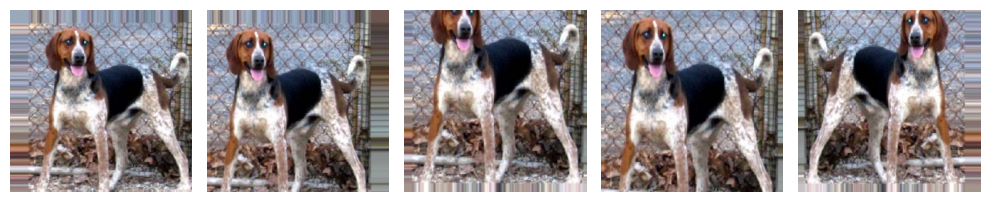

In [11]:
augmented_images = [train_data_gen[0][0][0] for i in range(16)]
plotImages(augmented_images)

Validation 데이터에도 train 데이터와 같은 동일한 작업을 해 줍니다. 그러나 Validation 데이터는 classification이 잘 되는지 평가하는 용도로 사용되기 때문에 데이터의 스케일만 변경해 줍니다.

In [12]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [13]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


Validation 데이터를 확인해 봅시다. 크게 이미지와 정답 데이터로 구성이 되어 있습니다.

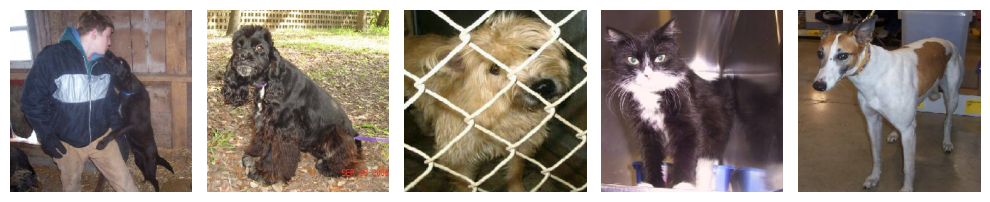

In [14]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [15]:
_[:5] # 정답 데이터

array([1., 1., 1., 0., 1.], dtype=float32)

## 문제 1-1. VGG16 모델 구현하기
이제 VGG16 모델을 구현해 볼 시간입니다. 바로 혼자서 모델을 구현하라고 하면 어렵겠죠? 그래서 참고할만한 모델 구현 코드를 아래에 적어 보았습니다. 실제 VGG16 모델과는 살짝 구조가 다르기 때문에 이미지를 보면서 어느 부분이 다른치 찾아 보는 것도 좋을 것 같습니다.

In [16]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [17]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        print("Name:", gpu.name)
        print("Type:", gpu.device_type)
else:
    print("No GPUs found")

Name: /physical_device:GPU:0
Type: GPU


In [18]:
# 문제1-1. 이미지에 나온 VGG16 모델을 구현하세요.

input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
#x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
#x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

# x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
# #x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
# #x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
# x=tf.keras.layers.MaxPool2D((2, 2))(x)

# x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# #x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
# x=tf.keras.layers.MaxPool2D((2, 2))(x)

# x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# #x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
# x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Flatten()(x)
#x=tf.keras.layers.Dense(4096, activation='relu')(x)
#x=tf.keras.layers.Dense(4096, activation='relu')(x)
#x=tf.keras.layers.Dense(1028, activation='relu')(x)
# x=tf.keras.layers.Dense(512, activation='relu')(x)
x=tf.keras.layers.Dense(64, activation='relu')(x)
x=tf.keras.layers.Dense(16, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 batch_normalization (Batch  (None, 256, 256, 64)      256       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 128)     73856     
                                                                 
 batch_normalization_1 (Bat  (None, 128, 128, 128)     512   

손실함수, optimizer, metric을 설정해 줍니다.

손실함수와 metric은 분류 task에 따라 다양하게 바꿀 수 있습니다. optimizer도 Adam 외에 다양한 것을 사용할 수 있습니다. 자유롭게 바꿔보세요.

In [19]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

#callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
# callback 함수를 활용하고 싶다면 추가해서 학습하는 데에 활용해 보세요.

모델 학습을 시켜봅시다.
data generator는 입력 데이터와 타겟(라벨)의 batch를 끝없이 반환합니다.
batch가 끝없이 생성되기 때문에, 한 번의 epoch에 generator로부터 얼마나 많은 샘플을 뽑을지 모델에 전달해야 합니다.
만약 batch_size=20이고 steps_per_epoch=100일 경우 (데이터, 라벨)의 쌍 20개가 생성되고, 크기가 20인 batch 데이터를 100번 학습하면 1 epoch이 완료됩니다. 단, 크기 20의 batch 데이터는 매번 랜덤으로 생성됩니다.

일반적으로 (전체 데이터 길이/batch_size)를 steps_per_epoch으로 설정합니다.

In [20]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      #callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/5
125/125 [==============================] - 52s 347ms/step - loss: 44.6182 - binary_accuracy: 0.4940 - val_loss: 0.6932 - val_binary_accuracy: 0.5000
Epoch 2/5
125/125 [==============================] - 41s 327ms/step - loss: 0.6934 - binary_accuracy: 0.4890 - val_loss: 0.6932 - val_binary_accuracy: 0.5000
Epoch 3/5
125/125 [==============================] - 43s 342ms/step - loss: 0.6928 - binary_accuracy: 0.4930 - val_loss: 0.6926 - val_binary_accuracy: 0.5010
Epoch 4/5
125/125 [==============================] - 51s 407ms/step - loss: 0.6931 - binary_accuracy: 0.5070 - val_loss: 0.6920 - val_binary_accuracy: 0.5010
Epoch 5/5
125/125 [==============================] - 43s 348ms/step - loss: 0.6941 - binary_accuracy: 0.4970 - val_loss: 0.6918 - val_binary_accuracy: 0.5020


학습이 되었다면 시각화를 통해 정확도를 알아봅시다.

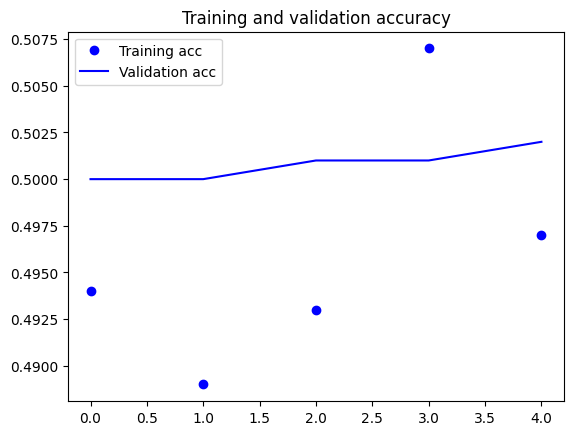

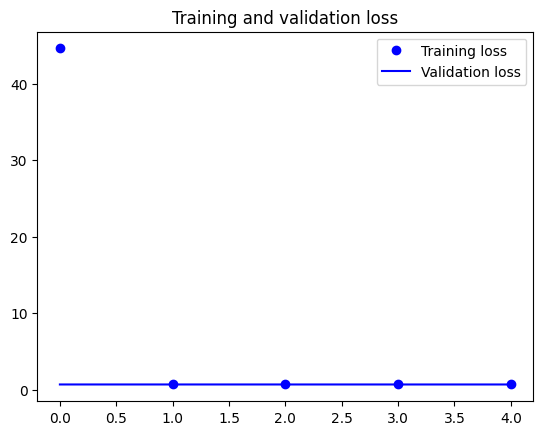

In [21]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## 문제 1-2. 다양한 방법을 사용하여 모델의 성능 올리기
hyperparameter 변경, 모델 수정, optimizer 변경, skip connection, pre-trained model 등 다양한 방법을 사용하면 모델의 성능을 높일 수 있습니다. 다양한 실험을 통해 성능을 올려 보세요.

In [22]:
# 문제 1-2. hyperparameter 설정
batch_size = 32 # 학습 속도 향상을 위해 batch_size을 소폭 상승시켰다.
epochs = 10
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [23]:
# 문제 1-2. 데이터 generator 생성
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


## Inception 모델을 활용한 학습

In [24]:
# 인셉션 모듈을 만드는 데에 필요한 모듈 불러오기
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.utils import plot_model # 모델 시각화

In [33]:
# 문제 1-2. 모델 구현
# Inception 블록을 만들기 위한 함수
def inception(input_layer, conv1_filter, conv3_in, conv3_out, conv5_in, conv5_out, pooling_out):

    # 1x1 kernel
    conv1 = keras.layers.Conv2D(conv1_filter, (1,1), padding='same', activation='relu')(input_layer)

    # 3x3 kernel
    conv3 = keras.layers.Conv2D(conv3_in, (1,1), padding='same', activation='relu')(input_layer)
    conv3 = keras.layers.Conv2D(conv3_out, (3,3), padding='same', activation='relu')(conv3)

    # 5x5  kernel
    conv5 = keras.layers.Conv2D(conv5_in, (1,1), padding='same', activation='relu')(input_layer)
    conv5 = keras.layers.Conv2D(conv5_out, (5,5), padding='same', activation='relu')(conv5)

    # 3x3 max pooling layer
    pool = keras.layers.MaxPooling2D((3,3), strides=(1,1), padding='same')(input_layer)
    pool = keras.layers.Conv2D(pooling_out, (1,1), padding='same', activation='relu')(pool)

    # 위 4개의 layer 통해서 나온 feature map들을 모두 concatenation 한다.
    # 특별히 concatenated_feature_map에 1x1 컨볼루션으로 채널수를 96에서 32로 줄였다.
    concatenated_feature_map = keras.layers.Concatenate()([conv1, conv3, conv5, pool])
    concatenated_feature_map = keras.layers.Conv2D(32, (1,1), padding='same', activation='relu')(concatenated_feature_map)
    pooled_feature_map = keras.layers.MaxPooling2D((3,3), strides=(1,1), padding='same')(concatenated_feature_map)

    x=tf.keras.layers.Flatten()(pooled_feature_map)
    #x=tf.keras.layers.Dense(4096, activation='relu')(x)
    #x=tf.keras.layers.Dense(4096, activation='relu')(x)
    #x=tf.keras.layers.Dense(1028, activation='relu')(x)
    #x=tf.keras.layers.Dense(512, activation='relu')(x)
    x=tf.keras.layers.Dense(64, activation='relu')(x)
    x=tf.keras.layers.Dense(16, activation='relu')(x)
    out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

    return out_layer

## ㄴ 문제해결 회고
1. 모델 생성부터 모델 학습 과정에서 큰 파라미터 개수로 인한 ResourceExhaustedError가 발생하였다.
2. Threshold 53% 정확도를 넘는 것을 기준으로 최대한 파라미터를 줄이는 모델을 설계하는 것을 목표로 하였다.
3. 따라서 연산량과 파라미터를 줄일 수 있는 1x1 convolution filter를 활용한 Inception Module을 태스크를 수행할 모델로 선정하였다.
4. Inception Module 하나로도 ResourceExhaustedError가 발생하였다.
5. 이에 Feature map Concatenation을 거친 output에 한번 더 1x1 convolution 연산을 적용하여 channel 수를 96에서 32로 줄여서 연산량을 감소시켰다.

In [26]:
input_data = keras.layers.Input(shape=(256, 256, 3))
inception_out = inception(input_data, 16, 16, 32, 16, 32, 16) # Filter 별 channel 수를 의도적으로 최소화하였다.

In [27]:
# 모델 만들기
model = keras.models.Model(inputs=input_data, outputs=inception_out)
# 생성한 모델의 구조 확인하기
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_3 (Conv2D)           (None, 256, 256, 16)         64        ['input_2[0][0]']             
                                                                                                  
 conv2d_5 (Conv2D)           (None, 256, 256, 16)         64        ['input_2[0][0]']             
                                                                                                  
 max_pooling2d_2 (MaxPoolin  (None, 256, 256, 3)          0         ['input_2[0][0]']             
 g2D)                                                                                       

In [28]:
# 문제 1-2. loss function, optimizer, metric 설정 및 모델 컴파일
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

#callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
# callback 함수를 활용하고 싶다면 추가해서 학습하는 데에 활용해 보세요.

In [29]:
# callback 함수를 활용하고 싶다면 추가해서 학습하는 데에 활용해 보세요.
from tensorflow.keras import callbacks
check_point_cb = callbacks.ModelCheckpoint('MyInception_dog_cat.h5', save_best_only=True)
early_stopping_cb = callbacks.EarlyStopping(patience=3, monitor='val_binary_accuracy',
                                  restore_best_weights=True)

In [30]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=[check_point_cb, early_stopping_cb],
      validation_freq=1)

Epoch 1/10
63/62 [==============================] - ETA: 0s - loss: 57.0907 - binary_accuracy: 0.5025

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


62/62 [==============================] - 83s 1s/step - loss: 57.0907 - binary_accuracy: 0.5025 - val_loss: 0.6924 - val_binary_accuracy: 0.4890
Epoch 2/10
62/62 [==============================] - 54s 863ms/step - loss: 0.6828 - binary_accuracy: 0.5375 - val_loss: 0.7226 - val_binary_accuracy: 0.5920
Epoch 3/10
62/62 [==============================] - 64s 1s/step - loss: 0.6734 - binary_accuracy: 0.5640 - val_loss: 0.6558 - val_binary_accuracy: 0.5970
Epoch 4/10
62/62 [==============================] - 45s 720ms/step - loss: 0.6675 - binary_accuracy: 0.5610 - val_loss: 0.6563 - val_binary_accuracy: 0.5930
Epoch 5/10
62/62 [==============================] - 62s 1s/step - loss: 0.6633 - binary_accuracy: 0.5730 - val_loss: 0.6481 - val_binary_accuracy: 0.6060
Epoch 6/10
62/62 [==============================] - 42s 677ms/step - loss: 0.6565 - binary_accuracy: 0.5925 - val_loss: 0.6841 - val_binary_accuracy: 0.5650
Epoch 7/10
62/62 [==============================] - 43s 690ms/step - loss: 0.

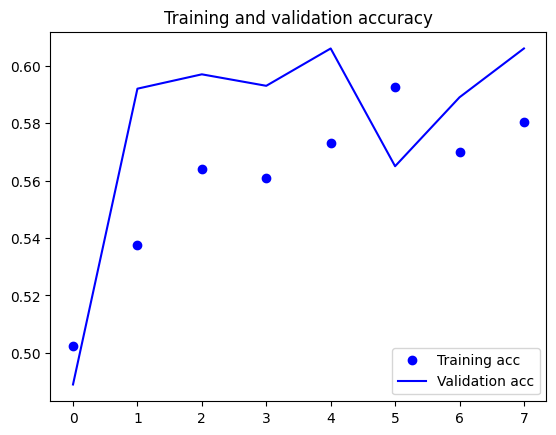

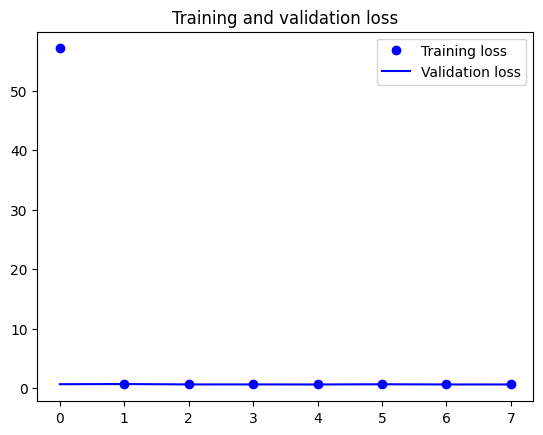

In [32]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## 결과
: 베이스라인 모델은 val_binary_accuracy 0.500 를 넘지 못했지만, 간단한 Inception Model 로 0.600 까지 성능향상을 이뤄냈다.

## 회고
- 느낀점
1. 옅은 CNN 모델을 설계해도 증가하는 파라미터 개수로 인해 ResourceExhaustedError가 발생하였다. Convolution Filter의 파라미터 개수와 Flatten - Dense layer 사이에 생성되는 파라미터 개수가 급격히 증가하면서 컴퓨팅 자원 오류가 반복적이게 발생하였다. 'Going deeper with convolutions'에서 정확도를 높이는데 집착하기 보다 Computational Cost를 줄이는 것을 우선순위에 두었다는 말의 의미를 체험하게 되었다.

2. 광용님께서 VGG16 Transfer Learning을 적용한 모델로 정확도 100% 에 근사한 모델을 보여주셨다. 모델 생성 과정에서 발생하는 문제(1번과 같은 학습과정에서의 오류)와 시간, 데이터 확보 등 비용을 줄이고, 모델 성능 향상을 이룰 수 있는 Transfer Learning의 강점을 옆에서 확인할 수 있었다.

- 문제해결을 시도한 점
1. ResourceExhaustedError를 해결하기 위해 Inception Module을 사용하였다. 1x1 Convolution Operation을 통해 feature map의 channel 개수를 최대한 줄이고자 하였다. 이러한 노력에도 불구하고 flatten layer - dense layer 사이에 급격한 파라미터 개수 증가로 인해 오류가 발생하였는데, 이때 concatenated된 feature map에 추가적으로 1x1 convolution operation을 적용하여 channel 개수를 96에서 32로 줄이는 것으로 연산량을 감소시켜 문제를 해결하였다.

- 더 시도할 수 있는 점
1. 컴퓨팅 자원과 시간이 받쳐준다면 더 깊은 Inception Module을 쌓아서 성능을 개선할 수 있다.
2. Pre-trained VGG16 또는 GoogleNet, ResNet을 활용하여 Transfer Learning을 수행할 수 있다. 이때, Cat-Dog Classification 태스크의 유사도와 데이터 개수가 상대적으로 작은 점을 고려하여 transfer learning 전략을 수립할 수 있다.
3. VGG16, GoogleNet, 그리고 ResNet은 ImageNet의 고양이, 개 클래스를 포함하고 있기 때문에, 데이터 유사도는 어느정도 높다고 가정할 수 있다. 반면에 내게 주어진 데이터를 상대적으로 작으므로 오버피팅을 피하기 위해여 위 모델의 Feature Extraction 부분은 Freeze 하고, Softmax Classifier 직전의 Dense Layer만 trainable하게 설정한다. 이러한 방식으로 효과적인 tranfer learning을 시도할 수 있다.

# 프로젝트 2: Object Detection

In [1]:
!pip3 install tensorflow-estimator==2.6.0

     |████████████████████████████████| 462 kB 6.2 MB/s            
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
      Successfully uninstalled tensorflow-estimator-2.7.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-gpu 2.6.0 requires numpy~=1.19.2, but you have numpy 1.21.4 which is incompatible.
tensorflow-gpu 2.6.0 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
tensorflow-gpu 2.6.0 requires typing-extensions~=3.7.4, but you have typing-extensions 4.0.1 which is incompatible.


In [2]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [3]:
# 이미지 시각화 함수
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수를 만들어둡니다.

In [4]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

Bounding Box를 만드는 함수를 만듭니다.

In [5]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

이미지 위에 class 이름과 score를 나타내는 함수도 만듭니다.

In [6]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

이미지를 불러옵니다.

원하는 이미지를 불러오고, 가로와 세로를 변경해 보는 실험을 진행해 보세요.

Image downloaded to /tmp/tmpw_nr7t06.jpg.


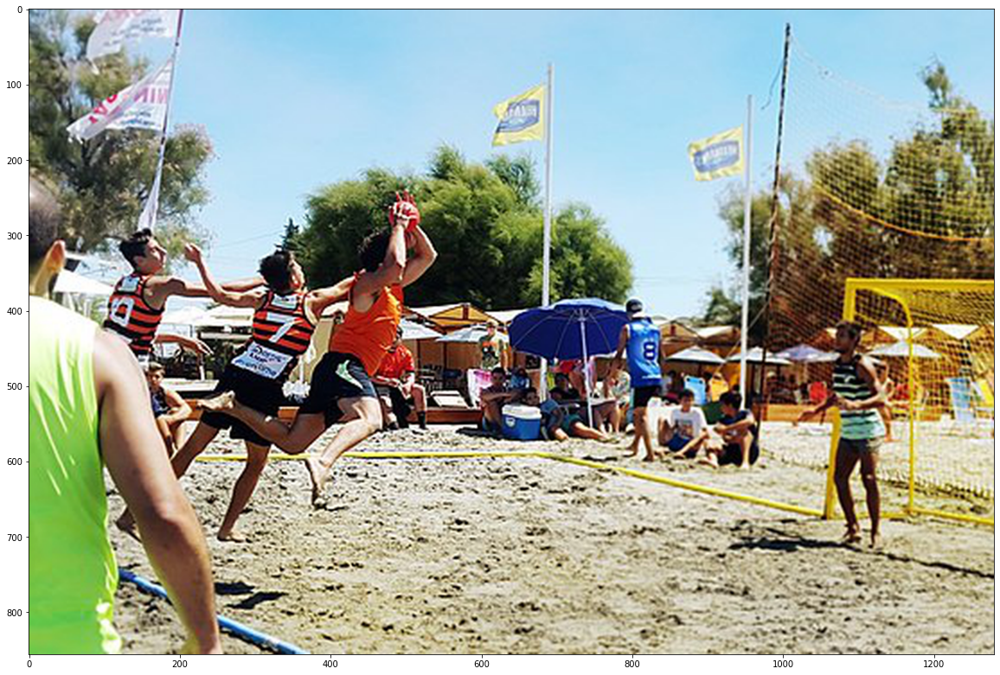

In [7]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

tfhub에서 사전 학습된(Pre-trained) InceptionResnet 모델을 사용한 Faster RCNN 모델을 불러옵니다.

tfhub : https://www.kaggle.com/models?tfhub-redirect=true

InceptionResnet : https://arxiv.org/pdf/1602.07261v2.pdf

In [8]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [9]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

Detector를 실행하는 함수를 만듭니다.

In [10]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

detector를 실행시켜 봅시다.

Found 100 objects.
Inference time:  82.62239217758179


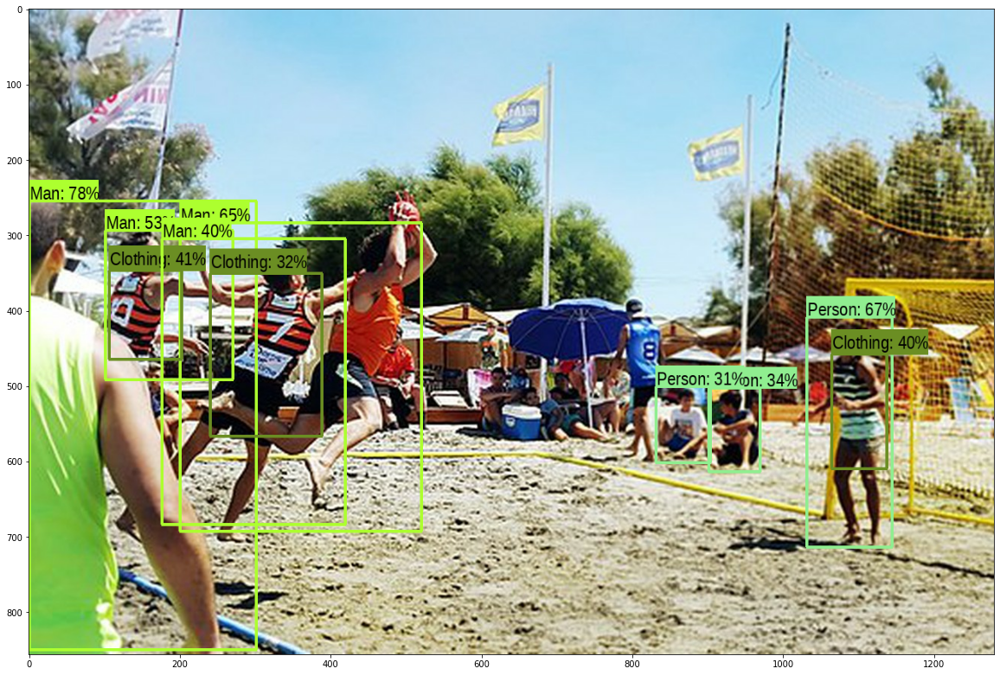

In [11]:
run_detector(detector, downloaded_image_path)

## 문제 2-1. 다른 이미지 테스트해보기
원하는 이미지를 불러와 결과를 확인해 봅시다.

Image downloaded to /tmp/tmpqbv5x5u1.jpg.


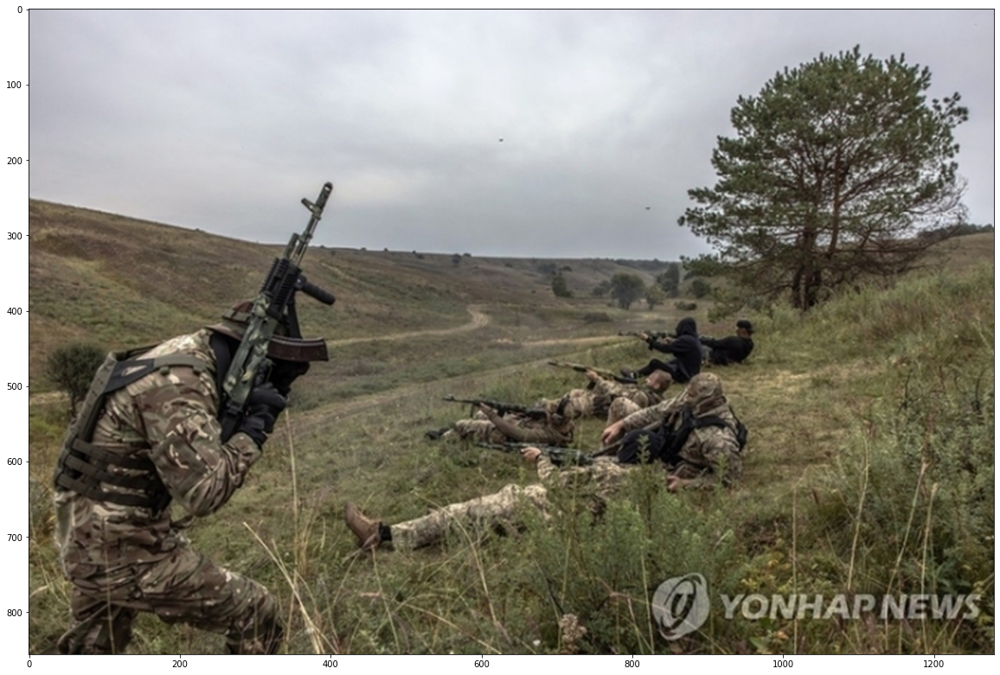

In [12]:
# 이미지 불러오기 (매일경제, “평균 43세, 신병 징집 불가피”…전투 지친 ‘이 나라’ 병력교체 간절하다는데)
image_url = "https://imgnews.pstatic.net/image/009/2024/03/15/0005272840_001_20240315134903124.jpg?type=w647"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  1.4731850624084473


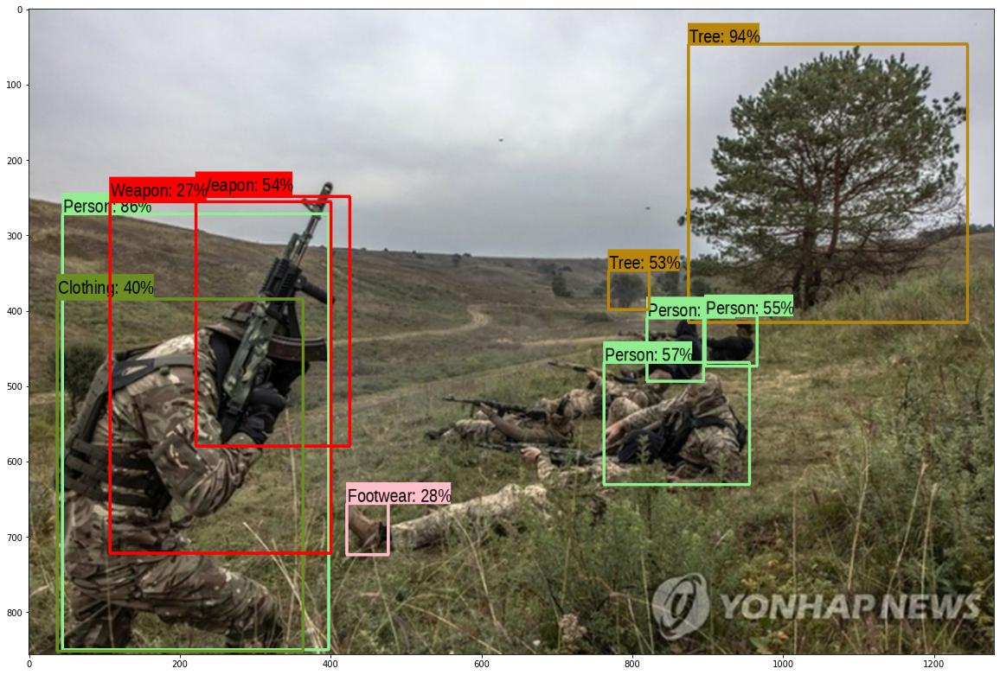

In [13]:
# 테스트
run_detector(detector, downloaded_image_path)

## 문제 2-2. 다양한 pre-trained model 테스트해보기
Faster RCNN 외에도 Object Detection을 할 수 있는 다양한 사전 학습 모델이 있습니다. tfhub을 탐색하여 사용할 수 있는 1개 이상의 모델을 불러와 결과를 테스트해보고, 그 결과를 비교해 보세요.

tfhub : https://www.kaggle.com/models?tfhub-redirect=true

## 새롭게 적용한 pre-trained model : google/mobilenet-v2
: https://www.kaggle.com/models/google/mobilenet-v2

SSD-based object detection model trained on Open Images V4 with ImageNet pre-trained MobileNet V2 as image feature extractor.

In [19]:
# Example Code of mobilenet_v2

# # Apply image detector on a single image.
# detector = hub.Module("https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow1/variations/openimages-v4-ssd-mobilenet-v2/versions/1")
# detector_output = detector(image_tensor, as_dict=True)
# class_names = detector_output["detection_class_names"]

In [14]:
# 1. mobilenet-v2 페이지에서 제공하는 url을 사용하여 detector 만들기
module_handle = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow1/variations/openimages-v4-ssd-mobilenet-v2/versions/1"
detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Found 100 objects.
Inference time:  8.288182020187378


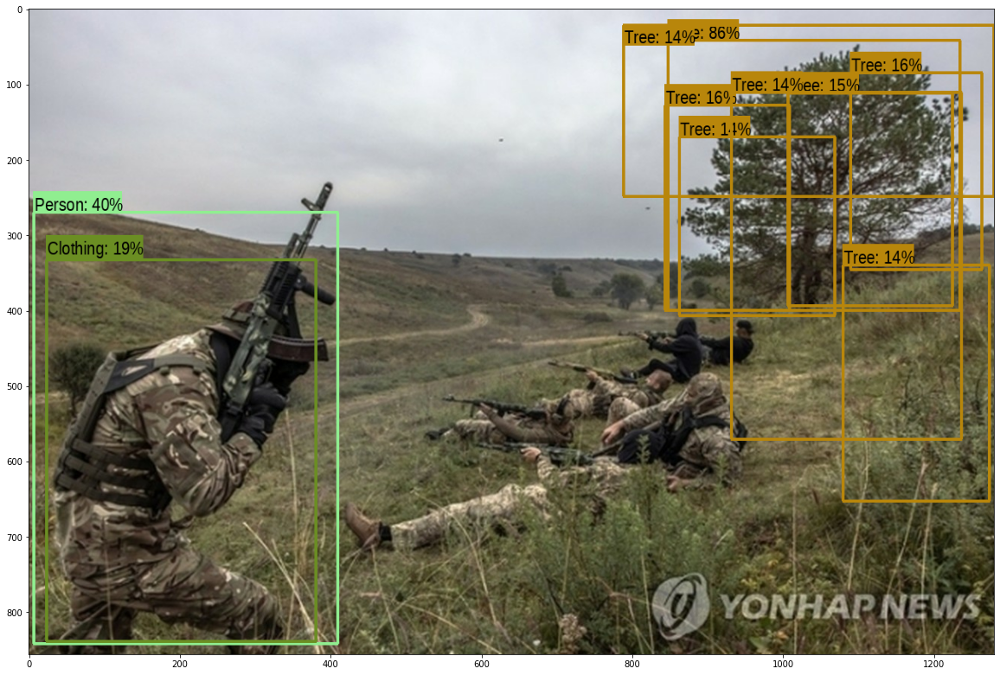

In [15]:
# 2. 테스트
run_detector(detector, downloaded_image_path)

## ㄴ 결과 비교
1. inception_resnet_v2/1 모델이 사람, 옷, 나무, 신발, 무기와 같은 클래스를 더 높은 확률로 더 다양한 개체로 분류하였다.
2. 반면에 mobilenet-v2 모델은 나무를 localize 하는데 불필요하게 RoI 가 중복되는 결과를 보였다. 또한 ImageNet에 존재하지 않는 Weapon 같은 클래스를 분류하지 못했다. 사진 가운데 누워있는 사람 개체 또한 분류하지 못하였다.
3. 결과적으로 주어진 이미지는 inception_resnet_v2/1 모델에 사용된 데이터와 유사도가 높았을 것이라고 생각한다.

Image downloaded to /tmp/tmpxq4x6ugu.jpg.
Found 100 objects.
Inference time:  0.2542250156402588


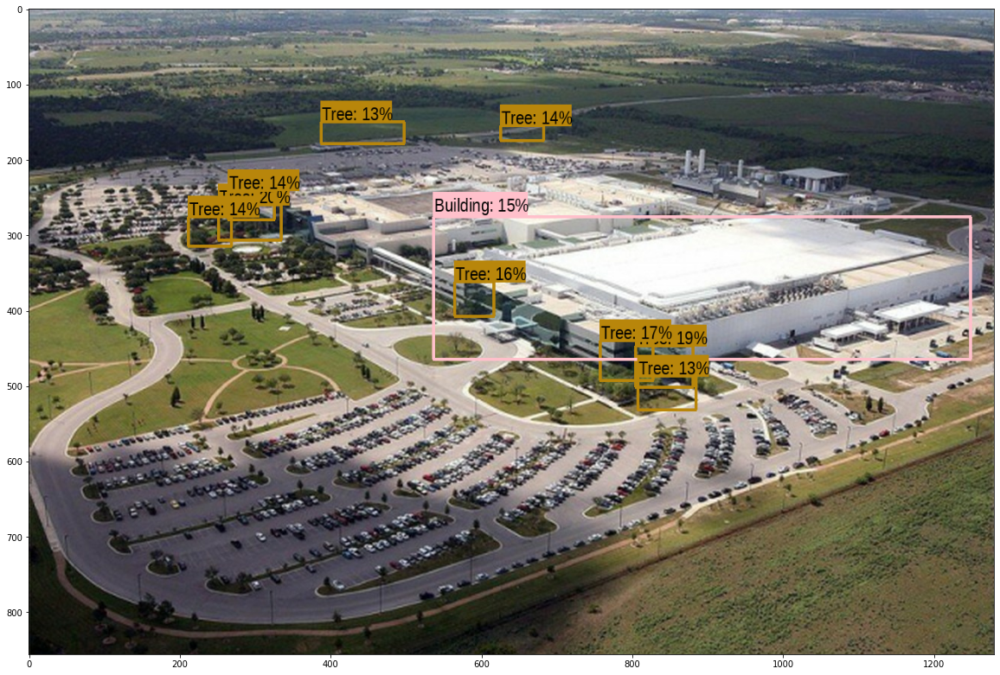

In [17]:
# 다른 이미지에 적용
image_url_2 = "https://imgnews.pstatic.net/image/011/2024/03/15/0004313867_001_20240315173806945.jpg?type=w647"
downloaded_image_path_2 = download_and_resize_image(image_url_2, 1280, 856, False)  # new_width와 new_height를 변경해 보세요.

run_detector(detector, downloaded_image_path_2)

Image downloaded to /tmp/tmp0wwdcnsz.jpg.
Found 100 objects.
Inference time:  0.27719593048095703


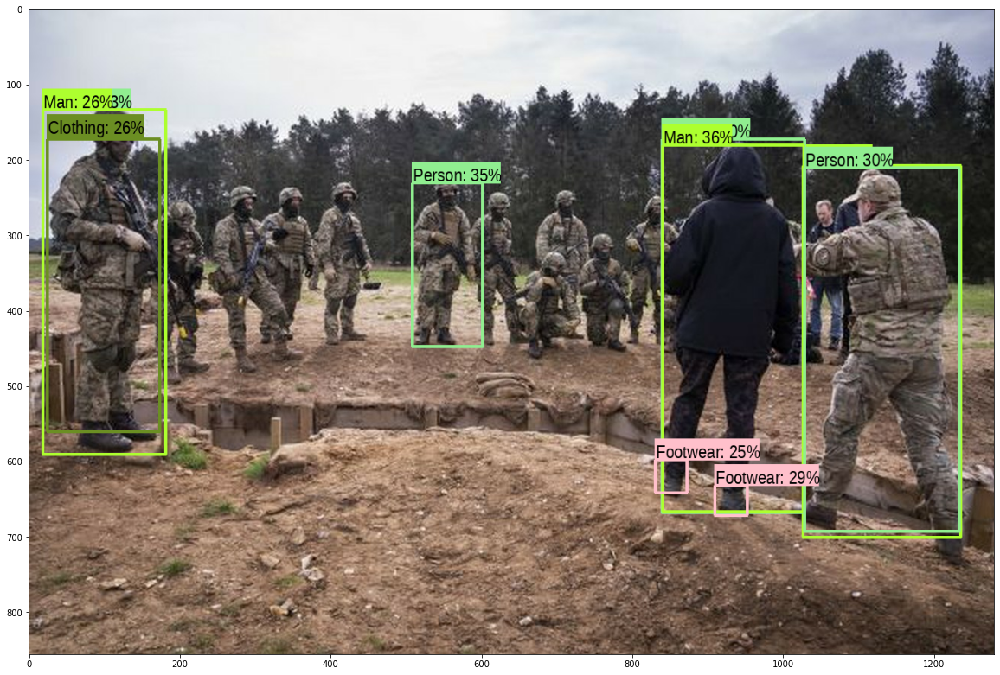

In [18]:
# 다른 이미지에 적용
image_url_3 = "https://imgnews.pstatic.net/image/005/2024/03/15/2024031517081973607_1710490099_0019896959_20240315173205775.jpg?type=w647"
downloaded_image_path_3 = download_and_resize_image(image_url_3, 1280, 856, False)  # new_width와 new_height를 변경해 보세요.

run_detector(detector, downloaded_image_path_3)

## 결과 해석
1. mobilenet-v2 은 ImageNet 데이터를 바탕으로 학습된 모델이다.
2. ImageNet에 사람, 신발, 옷, 나무, 건물과 같은 클래스가 있기 때문에 유사도가 있는 데이터만 검출하였다. inception_resnet_v2/1 에서 검출한 weapon 과 같은 클래스는 당연히 식별되지 않았다.

## 회고
- 앞으로 해결해야 할 문제
1. 처음 시도에 Keras CV 라이브러리를 바탕으로 사용하는 YOLOV8 pre-trained model을 선택하였다. 그러나 Kears CV 라이브러리와 tensorflow-estimator 2.6.0 버전 간에 호환성 문제가 발생하였다. 라이브러리를 업데이트하고, 삭제하고, 새롭게 설치하는 등 호환성 문제해결을 위해 다양한 시도를 했으나, 충돌이 해결되지 않았다. 이 부분은 현재 내가 다룰 수 있는 범위를 넘어서는 문제로 생각되어 다른 pre-trained model을 탐색하였다.


2. 앞으로 자연어처리에서도 pre-trained model을 활용하게 될 것인데 나의 능력범위를 알고, 라이브러리 호환성 문제를 잘 대처해야 할 것 같다.


- 느낀 점
1. 도메인에 특화된 pre-trained model, 즉 데이터 유사도를 고려한 model 선택의 중요성을 환기하게 되었다. 개인적으로 군 관련 주제로 이미지를 선택했는데, 군과 관련된 데이터는 highly confidential 하기 때문에 모델링 이전 데이터 준비 단계에서 많은 노력과 비용이 필요하다는 사실을 인지하게 되었다. 운 좋게 군 관련 유사도가 높은 모델이 존재한다 할지라도 실제 현장에 대한 태스크를 수행하기 위해서는 추가적인 도메인 데이터 수집으로 upper feature extraction layer를 업데이트하는 과정이 필요할 것이라고 생각한다. ImageNet 기반 pre-trained model은 역시 군과 관련된 객체를 탐지하지 못했다.


2. 내게 주어진 시간과 컴퓨팅 자원을 고려한 모델링과 데이터 처리 전략 수립의 중요성을 체감하였다. 아이펠톤을 앞두고 지금부터 데이터 분석/모델링 프로젝트 계획서 및 보고서 작성 양식을 미리 생각하고 준비해야할 필요성을 느꼈다.